__Author__:Bogdan Bintu

__Date__:2/7/2019

__Scope__: New analysis tool

In [2]:
#External packages
import sys,glob,os
import numpy as np
import cPickle as pickle
import matplotlib.pylab as plt

#Internal packages
#add path
workbookDir = os.getcwd()
sys.path.append(os.path.dirname(workbookDir)+os.sep+r'\CommonTools')
#imports
import IOTools as io
import FittingTools as ft
import AlignmentTools as at
#for exmploring the data
import MaxViewer as mv

In [5]:
%matplotlib notebook

### Read the data

In [4]:
#input the folders that store the data
master_folder = r'T:\20190227_g4\FISH\images\renamed_images'
#define analysis folder
analysis_folder =r'T:\20190227_g4\Analysis'


In [4]:
if not os.path.exists(analysis_folder):
    os.makedirs(analysis_folder)
#get a list of hybe folders
files =[fl for fl in glob.glob(master_folder+os.sep+'FISH_*.dax')
       if 'day' not in fl]
def get_fov(fl):
    return int(os.path.basename(fl).split('_')[1])
def get_hybe(fl):
    return int(os.path.basename(fl).split('_')[2].replace('.dax',''))
files_hybes = ft.partition_map(files,map(get_hybe,files))

In [5]:
len(files_hybes)

24

In [122]:
%matplotlib notebook

### Compute the flat field correction

In [9]:
reload(ft)
im_meds = ft.get_ims_meds(files_hybes[1],num_cols=4,median_fl=analysis_folder+os.sep+'im_repairs_2col.npy',
                         overwrite=True,tag='mid',verbose=True)


T:\20190227_g4\FISH\images\renamed_images\FISH_00_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_01_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_02_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_03_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_04_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_05_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_06_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_07_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_08_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_09_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_10_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_11_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_12_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_13_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_14_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_15_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_16_1.dax
T:\20190227_g4\FISH\images\renamed_images\FISH_1

### Compute the mean to pick chromosome teritory

In [6]:
from tqdm import tqdm_notebook as tqdm
reload(io)
reload(ft)

<module 'FittingTools' from 'E:\Users\Addison\TAD_analysis\ChromatinImagingV2-master\\CommonTools\FittingTools.pyc'>

In [7]:
im_repairs = np.load(analysis_folder+os.sep+'im_repairs_2col.npy')

files_keep = np.array(files_hybes).T

In [43]:
im_repairs = np.load(analysis_folder+os.sep+'im_repairs_2col.npy')

files_keep = np.array(files_hybes).T

for fov_hybes in tqdm(files_keep):
    fov = get_fov(fov_hybes[0])
    dax_fl = analysis_folder+os.sep+str(fov).zfill(3)+'_mean.dax'
    finalfit_fl = dax_fl.replace('.dax','_finalfit.npy')
    if not os.path.exists(finalfit_fl):
        # map data ##############
        #for this experiment, name telomeres as beads to use for rough alignment
        daxs_signal,names_signal,daxs_beads,names_beads = io.get_ims_fov_daxmap(fov_hybes,
                                                                            col_tags = ['beads','discard','647','750'])
        #compute pixel drift ######
        sz=200
        dax_bead_ref = daxs_beads[0]
        im_ref1 = ft.grab_block(dax_bead_ref,np.array(dax_bead_ref.shape)/2,[sz]*3)
        im_ref2 = ft.grab_block(dax_bead_ref,np.array(dax_bead_ref.shape)/2+[0,sz,0],[sz]*3)
        tzxys = []
        for dax_bead in daxs_beads:
            im1 = ft.grab_block(dax_bead,np.array(dax_bead.shape)/2,[sz]*3)
            im2 = ft.grab_block(dax_bead,np.array(dax_bead.shape)/2+[0,sz,0],[sz]*3)
            tzxy1 = ft.fft3d_from2d(im_ref1,im1)
            tzxy2 = ft.fft3d_from2d(im_ref2,im2)
            tzxys.append([tzxy1,tzxy2])
        #compute and save mean###########
        inds = range(len(daxs_signal))
        im_mean = np.zeros(daxs_signal[0].shape)
        print "Loading and averaging..."
        #Start after 2nd hyb to reduce effect of dye blobs
        for idax in tqdm(inds[2:]):
            dax = daxs_signal[idax]
            ibead = int(idax/(dax.num_col-1))
            tzxy1,tzxy2 = tzxys[ibead]
            if np.all(tzxy1==tzxy2):
                im = dax.get_im().astype(float)
                im = im/im_repairs[dax.color]
                im = ft.translate(im,tzxy1)
                zlim = np.min([im_mean.shape[0],im.shape[0]])
                im_mean[:zlim]+=im[:zlim]
            #dax_fl = analysis_folder+os.sep+fov.replace('.dax','_mean'+str(imn)+'.dax')
            #io.writeDax(im_means[imn],dax_fl)

        io.writeDax(im_mean,dax_fl)

        #fit and filter on intersection###
        print "Fitting..."
        zxyh = ft.return_candidate_centers(im_mean,dist_th=20,ex=20,ey=20,ez=2,gmin=2,gmax=5,filtsz=5,th_seed=6,
                                           plt_val=False,save_file=dax_fl.replace('.dax','_fits0.pkl'));
        np.save(finalfit_fl,zxyh)

In [ ]:
for fov_hybes in tqdm(files_keep):
    fov = get_fov(fov_hybes[0])
    dax_fl = analysis_folder+os.sep+str(fov).zfill(3)+'_mean.dax'
    finalfit_fl = dax_fl.replace('.dax','_finalfit.npy')
    

In [32]:
### Retranform to original fileform

finalfit_fls = glob.glob(analysis_folder+os.sep+'*_fits0.pkl')
old_coords = [pickle.load(open(fl,'rb'))['zxyh'] for fl in finalfit_fls]
coords = []

for coord_list in old_coords:
    coord_keep = np.empty((0,4))
    for coord in coord_list:
        if coord[3] > 7 and coord[0]<40:
            coord_ = np.reshape(coord,(1,4))
            coord_keep = np.append(coord_keep,coord_,0)
    coords.append(coord_keep)
    

def fl_to_fov(fl): return int((fl.split('_')[-3]).split('\\')[-1])

dic_save = {}
dic_save['class_ids'] = ft.flatten([[fl_to_fov(fl)]*len(coord) for coord,fl in zip(coords,finalfit_fls)])
dic_save['coords'] = ft.flatten([coord[:,[1,2,0]] for coord in coords])
dic_save['names']= [os.path.basename(fl).split('_mean')[0] for fl in finalfit_fls]
pickle.dump(dic_save,open(analysis_folder+os.sep+'Selected_Spot.pkl','w'))

In [26]:
finalfit_fls = glob.glob(analysis_folder+os.sep+'*_fits0.pkl')
coords = [pickle.load(open(fl,'rb'))['zxyh'] for fl in finalfit_fls]

In [33]:
print coords[3].shape

(114L, 4L)


<IPython.core.display.Javascript object>


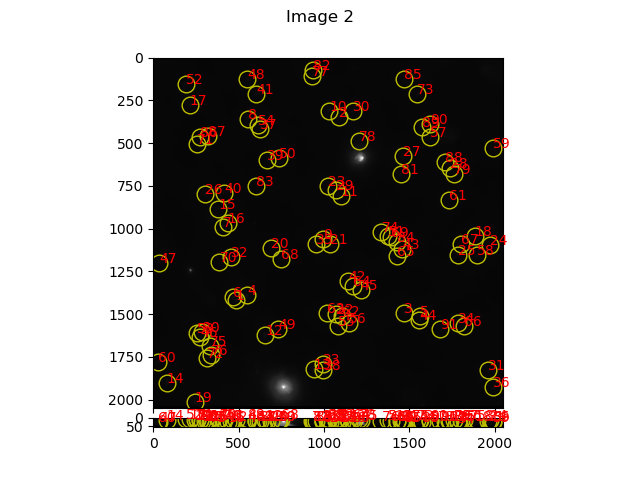

In [123]:
ims = [io.DaxReader(fl).loadMap() for fl in np.sort(glob.glob(analysis_folder+os.sep+'*.dax'))]#memory map is fine for visualizing
ob = mv.imshow_mark_3d(ims,save_file=analysis_folder+os.sep+'Selected_Spot.pkl')


In [47]:
files =[fl for fl in glob.glob(master_folder+os.sep+'FISH_*.dax')]
def get_fov(fl):
    return int(os.path.basename(fl).split('_')[1])
def get_hybe(fl):
    return int(os.path.basename(fl).split('_')[2].replace('.dax',''))
files_hybes = ft.partition_map(files,map(get_hybe,files))
fovs = np.sort(map(os.path.basename,files_hybes[0]))
    ##Load the selected chromosme data
dic = pickle.load(open(analysis_folder+os.sep+'Selected_Spot.pkl','r'))
chr_pts = ft.partition_map(dic['coords'],dic['class_ids'])
fov_ids = np.unique(dic['class_ids'])

In [125]:
dic

{0: ({'00.dax_647': array([[5.70659565e+00, 1.93864357e+01, 1.27158822e+03, 6.85266092e+01,
           2.06744946e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00],
          [1.92188546e+00, 1.94848659e+01, 1.28194325e+03, 5.80722631e+01,
           1.30331797e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00],
          [1.32199857e+00, 1.71869498e+01, 1.28392872e+03, 6.22885358e+01,
           1.30269916e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00],
          [1.18151862e+00, 2.44742175e+01, 1.26535415e+03, 6.53634513e+01,
           1.19366429e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00],
          [5.05892245e-01, 2.66880494e+01, 1.25381582e+03, 5.42650060e+01,
           1.01241403e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00],
          [4.87344975e-01, 2.66912731e+01, 1.25381592e+03, 5.42665135e+01,
           1.01899109e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00],
          [1.00477949e+00, 2.50834553e+01, 1.26454181e+03, 6.54662684e+01,
  

In [56]:
ind = 1
fov_id = fov_ids[ind]
file_=fovs[fov_id]
fov_files = []
for hybe in files_hybes:
    fov_files.append(hybe[fov_id])
print fov_files

['T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_01_00.dax', 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_01_1.dax', 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_01_2.dax', 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_01_3.dax', 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_01_4.dax', 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_01_5.dax', 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_01_6.dax', 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_01_7.dax', 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_01_8.dax', 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_01_9.dax', 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_01_10.dax', 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_01_11.dax', 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_01_12.dax', 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_01_13.dax', 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_01_14.dax', 'T:\\20190227_g4\\FISH\\images\\r

In [17]:
ind = 1
    ### volatile ###########################
master_folder = r'T:\20190227_g4\FISH\images\renamed_images'
    #define analysis folder
analysis_folder =r'T:\20190227_g4\Analysis'
    #flat field correction
im_repairs = np.load(analysis_folder+os.sep+'im_repairs_2col.npy')
    
    
    
    
    
    
    
    #get a list of hybe files
files =[fl for fl in glob.glob(master_folder+os.sep+'FISH_*.dax')]
def get_hybe(fl):
    return int(os.path.basename(fl).split('_')[2].replace('.dax',''))
files_hybes = ft.partition_map(files,map(get_hybe,files))
fovs = np.sort(map(os.path.basename,files_hybes[0]))
    ##Load the selected chromosme data
dic = pickle.load(open(analysis_folder+os.sep+'Selected_Spot.pkl','r'))
chr_pts = ft.partition_map(dic['coords'],dic['class_ids'])
fov_ids = np.unique(dic['class_ids'])
    
    
    ###paramaters
overwrite=False
force_drift=False
    
    #drift paramaters
ref=2 #drift reference hybe
sz_ex=300 #the effective size of the cube to do drift correction
hseed_beads=0 # The minimum bead height (prefitting)
nbeads = 500 # The maximum number of beads
    


    #distance/numer of points cutoffs
cutoff_window = 30 #fitted points within this distance will be reported
cutoff_chr = 30 #if no prefered brightness points are detected within this distance, then include low brightness ones
min_pts = 10 # number of fits/ window
th_fluctuations = 2 # 2 std away for selecting a spot

    ##RUN

from scipy.spatial.distance import cdist


In [21]:
ind = 47
if ind:
    fov_id = fov_ids[ind]
    file_=fovs[fov_id]
    #Make file list with all hybs for a given FOV
    fov_files = []
    for hybe in files_hybes:
        fov_files.append(hybe[fov_id])
    chr_pts_ = chr_pts[ind] #positions of the selected centers of chromosomes in reference frame.
    chr_pts_ = np.array(chr_pts_)[:,::-1]#zxy coords of chromosomes already in the right position

    #Decide where to save the candidate positions of the hybe
    fl_cands = analysis_folder+os.sep+file_.replace('_00.dax','__current_cand.pkl')#file where to save candidates
    fl_cor = analysis_folder+os.sep+file_.replace('_00.dax','__drift.pkl')#file where to save drift correction
    fl_cor_fls = analysis_folder+os.sep+file_.replace('_00.dax','__driftfiles.npy')

    print fl_cands

    candid_spot={}

    #load data (pseudo-memory mapping)
    #change to format with file list only, assert color names
    daxs_signal,names_signal,daxs_beads,names_beads = io.get_ims_fov_daxmap(fov_files,
                                                                         col_tags = ['beads','discard','647','750'])

T:\20190227_g4\Analysis\FISH_47__current_cand.pkl


In [25]:
if ind:
    ind = int(47)
    ### volatile ###########################
    master_folder = r'T:\20190227_g4\FISH\images\renamed_images'
    #define analysis folder
    analysis_folder =r'T:\20190227_g4\Analysis'
    #flat field correction
    im_repairs = np.load(analysis_folder+os.sep+'im_repairs_2col.npy')
    
    
    
    
    
    
    
    #get a list of hybe files
    files =[fl for fl in glob.glob(master_folder+os.sep+'FISH_*.dax')]
    def get_hybe(fl):
        return int(os.path.basename(fl).split('_')[2].replace('.dax',''))
    files_hybes = ft.partition_map(files,map(get_hybe,files))
    fovs = np.sort(map(os.path.basename,files_hybes[0]))
    ##Load the selected chromosme data
    dic = pickle.load(open(analysis_folder+os.sep+'Selected_Spot.pkl','r'))
    chr_pts = ft.partition_map(dic['coords'],dic['class_ids'])
    fov_ids = np.unique(dic['class_ids'])
    
    
    ###paramaters
    overwrite=True
    force_drift=False
    
    #drift paramaters
    ref=2 #drift reference hybe
    sz_ex=300 #the effective size of the cube to do drift correction
    hseed_beads=0 # The minimum bead height (prefitting)
    nbeads = 500 # The maximum number of beads
    


    #distance/numer of points cutoffs
    cutoff_window = 30 #fitted points within this distance will be reported
    cutoff_chr = 30 #if no prefered brightness points are detected within this distance, then include low brightness ones
    min_pts = 10 # number of fits/ window
    th_fluctuations = 2 # 2 std away for selecting a spot

    ##RUN

    from scipy.spatial.distance import cdist

    #iterate through good fields of view for which chromosomes have been selected
    #? not sure of purpose:      folders_keep = list(folders[:])
    #itterate through fields of view
    #Get selected chromosomal positions
    fov_id = fov_ids[ind]
    file_=fovs[fov_id]
    #Make file list with all hybs for a given FOV
    fov_files = []
    for hybe in files_hybes:
        fov_files.append(hybe[fov_id])
    chr_pts_ = chr_pts[ind] #positions of the selected centers of chromosomes in reference frame.
    chr_pts_ = np.array(chr_pts_)[:,::-1]#zxy coords of chromosomes already in the right position

    #Decide where to save the candidate positions of the hybe
    fl_cands = analysis_folder+os.sep+file_.replace('_00.dax','__current_cand.pkl')#file where to save candidates
    fl_cor = analysis_folder+os.sep+file_.replace('_00.dax','__drift.pkl')#file where to save drift correction
    fl_cor_fls = analysis_folder+os.sep+file_.replace('_00.dax','__driftfiles.npy')

    print fl_cands

T:\20190227_g4\Analysis\FISH_47__current_cand.pkl


In [63]:
fov_files

['T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_47_00.dax',
 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_47_1.dax',
 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_47_2.dax',
 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_47_3.dax',
 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_47_4.dax',
 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_47_5.dax',
 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_47_6.dax',
 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_47_7.dax',
 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_47_8.dax',
 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_47_9.dax',
 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_47_10.dax',
 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_47_11.dax',
 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_47_12.dax',
 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_47_13.dax',
 'T:\\20190227_g4\\FISH\\images\\renamed_images\\FISH_47_14.dax',
 'T:\\20190227_g4\\

In [81]:
for iim in np.arange(len(daxs_signal))[:]:
        #iim specific vars
    im = daxs_signal[iim]
        
    ibead = im.index_beads
    print ibead
    icol = im.color
    tag = names_signal[iim]
    print tag
    txyz_ = txyz[ibead]

1
FISH_01_00.dax_647
1
FISH_01_00.dax_750
2
FISH_01_1.dax_647
2
FISH_01_1.dax_750
3
FISH_01_2.dax_647
3
FISH_01_2.dax_750
4
FISH_01_3.dax_647
4
FISH_01_3.dax_750
5
FISH_01_4.dax_647
5
FISH_01_4.dax_750
6
FISH_01_5.dax_647
6
FISH_01_5.dax_750
7
FISH_01_6.dax_647
7
FISH_01_6.dax_750
8
FISH_01_7.dax_647
8
FISH_01_7.dax_750
9
FISH_01_8.dax_647
9
FISH_01_8.dax_750
10
FISH_01_9.dax_647
10
FISH_01_9.dax_750
11
FISH_01_10.dax_647
11
FISH_01_10.dax_750
12
FISH_01_11.dax_647
12
FISH_01_11.dax_750
13
FISH_01_12.dax_647
13
FISH_01_12.dax_750
14
FISH_01_13.dax_647
14
FISH_01_13.dax_750
15
FISH_01_14.dax_647
15
FISH_01_14.dax_750
16
FISH_01_15.dax_647
16
FISH_01_15.dax_750
17
FISH_01_16.dax_647
17
FISH_01_16.dax_750
18
FISH_01_17.dax_647
18
FISH_01_17.dax_750
19
FISH_01_18.dax_647
19
FISH_01_18.dax_750
20
FISH_01_19.dax_647
20
FISH_01_19.dax_750
21
FISH_01_20.dax_647
21
FISH_01_20.dax_750
22
FISH_01_21.dax_647
22
FISH_01_21.dax_750
23
FISH_01_22.dax_647
23
FISH_01_22.dax_750
24
FISH_01_23.dax_647


IndexError: list index out of range

In [69]:
txyz = pickle.load(open(analysis_folder+os.sep+'FISH_01__drift.pkl','r'))

In [70]:
txyz[12]

[array([0., 0., 0.]), array([0., 0., 0.])]

In [ ]:
### run in external terminal
python E:\Bogdan\Dropbox\code_Seurat\ChromatinImaging\Scripts\BatchAll2col.py

In [5]:
!E:\Bogdan\Dropbox\code_Seurat\ChromatinImaging\Scripts\BatchAll1col.py

In [5]:
print analysis_folder

T:\20190227_g4\Analysis


### Check drifts

In [5]:
%matplotlib inline

In [26]:
txyzs[:,0][12]

array([0., 0., 0.])

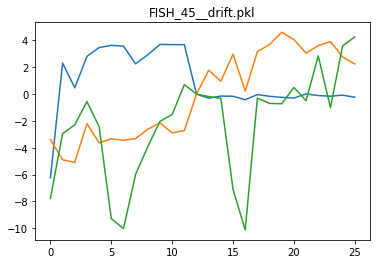

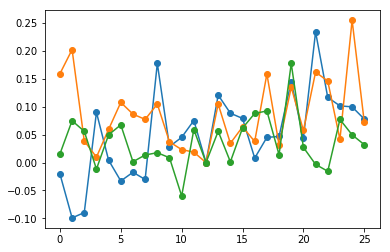

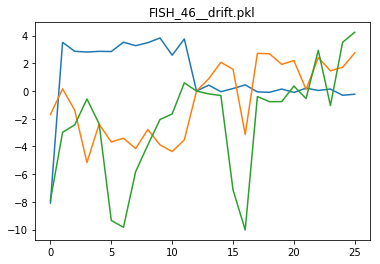

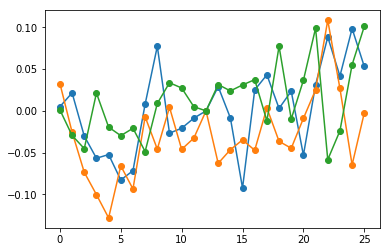

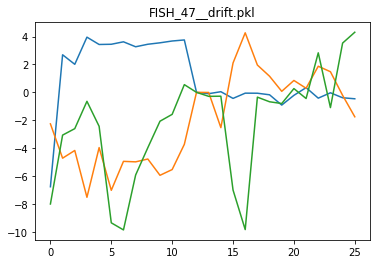

...

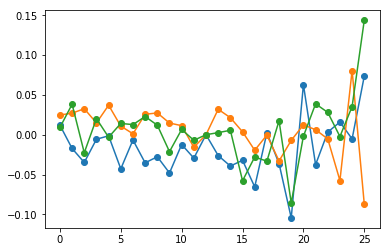

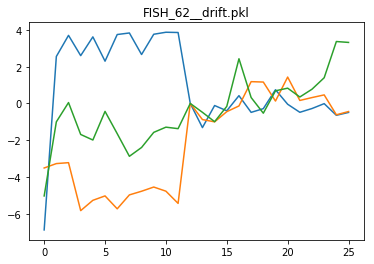

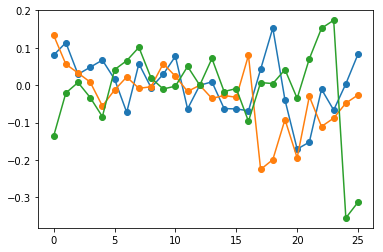

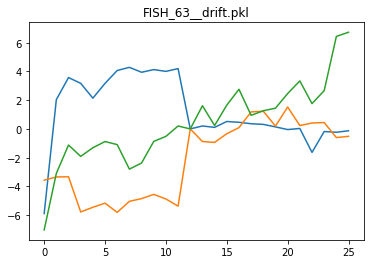

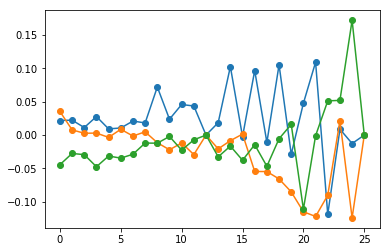

In [71]:
fls = glob.glob(analysis_folder+r'\*drift.pkl')
for fl in fls[45:]:
    txyzs = np.array(pickle.load(open(fl,'rb')))
    plt.figure()
    plt.title(os.path.basename(fl))
    plt.plot(txyzs[:,0])
    plt.figure()
    plt.plot(txyzs[:,1]-txyzs[:,0],'-o')

### Perform EM algoritm

#### Load all the data

In [135]:
### Read files ############

from tqdm import tqdm_notebook as tqdm

analysis_folder =r'T:\20190227_g4\Analysis'


files = glob.glob(analysis_folder+os.sep+'*__current_cand.pkl')
fovs = [os.path.basename(fl).split('__')[0]+'.dax'for fl in files]


dic_spots,dic_drifts = [],[]
for cand_fl in tqdm(files[:]):
    dic_spot,dic_drift = pickle.load(open(cand_fl,'rb'))
    dic_spots.append(dic_spot)
    dic_drifts.append(dic_drift)

#modification to unify keys
dic_spots_,dic_drifts_=[],[]
for dic_spot,dic_drift in zip(dic_spots,dic_drifts):
    dic_spot_ = {kspot:({'_'.join(key.split('_')[2:]):dic_spot[kspot][0][key] for key in dic_drift.keys()},
                    dic_spot[kspot][1]) 
                 for kspot in dic_spot}
    dic_drift_ = {}
    for key in dic_drift.keys():
        new_key = '_'.join(key.split('_')[2:])
        dic_drift_[new_key]=dic_drift[key]
    dic_spots_.append(dic_spot_)
    dic_drifts_.append(dic_drift_)
dic_spots,dic_drifts = dic_spots_,dic_drifts_
###############modification to unify keys

fovs_spots = ft.flatten([[fov]*len(dic)for fov,dic in zip(fovs,dic_spots)])

In [146]:
"""
master_folder = r'T:\20190227_g4\FISH\images\renamed_images'
files =[fl for fl in glob.glob(master_folder+os.sep+'FISH_*.dax')]
def get_hybe(fl):
    return int(os.path.basename(fl).split('_')[2].replace('.dax',''))
files_hybes = ft.partition_map(files,map(get_hybe,files))
[set_[5] for set_ in files_hybes]
""";

In [136]:
print np.sum(map(len,dic_spots))

5612


In [141]:
tags = np.unique([key for dic_drift in dic_drifts for key in dic_drift])
print tags
htags = ['5.dax_647', '6.dax_647', '7.dax_647', '8.dax_647', '9.dax_647', '10.dax_647', '11.dax_647', '1.dax_750', '12.dax_647', '13.dax_647', '00.dax_750', '2.dax_750', '14.dax_647', '3.dax_750', '4.dax_750', '15.dax_647', '16.dax_647', '17.dax_647', '18.dax_647', '19.dax_647', '20.dax_647', '21.dax_647', '22.dax_647', '23.dax_647', '5.dax_750', '6.dax_750', '7.dax_750', '8.dax_750', '9.dax_750', '10.dax_750', '11.dax_750', '1.dax_647', '12.dax_750', '13.dax_750', '00.dax_647', '2.dax_647', '14.dax_750', '3.dax_647', '4.dax_647', '15.dax_750', '16.dax_750', '17.dax_750', '18.dax_750', '19.dax_750', '20.dax_750', '21.dax_750']

['00.dax_647' '00.dax_750' '1.dax_647' '1.dax_750' '10.dax_647'
 '10.dax_750' '11.dax_647' '11.dax_750' '12.dax_647' '12.dax_750'
 '13.dax_647' '13.dax_750' '14.dax_647' '14.dax_750' '15.dax_647'
 '15.dax_750' '16.dax_647' '16.dax_750' '17.dax_647' '17.dax_750'
 '18.dax_647' '18.dax_750' '19.dax_647' '19.dax_750' '2.dax_647'
 '2.dax_750' '20.dax_647' '20.dax_750' '21.dax_647' '21.dax_750'
 '22.dax_647' '22.dax_750' '23.dax_647' '23.dax_750' '24.dax_647'
 '24.dax_750' '25.dax_647' '25.dax_750' '3.dax_647' '3.dax_750'
 '4.dax_647' '4.dax_750' '5.dax_647' '5.dax_750' '6.dax_647' '6.dax_750'
 '7.dax_647' '7.dax_750' '8.dax_647' '8.dax_750' '9.dax_647' '9.dax_750']


### Get chromatic correction

In [170]:
from scipy.spatial.distance import cdist
reps = ['23.dax_647','24.dax_750']
cutoff_distance = 4
zxy_750s,zxy_647s = [],[]
for fov in range(len(dic_spots)):
    for ichr in dic_spots[fov]:
        dic_cell = dic_spots[fov][ichr][0]
        p647,p750 = dic_cell.get(reps[0],[]),dic_cell.get(reps[1],[])
        if len(p647)>0 and len(p750)>0:
            zxy_647 = p647[:,1:4]
            zxy_750 = p750[:,1:4]
            D = cdist(zxy_647,zxy_750)
            i750 = np.argmin(D,axis=-1)
            d750 = np.min(D,axis=-1)
            keep = d750<cutoff_distance
            zxy_647s.extend(zxy_647[keep])
            zxy_750s.extend(zxy_750[i750][keep])
zxy_647s,zxy_750s=np.array(zxy_647s),np.array(zxy_750s)
dic_chr={}
dic_chr['zxy_647_750']=np.array([zxy_647s,zxy_750s])
pickle.dump(dic_chr,open(analysis_folder+os.sep+'pairs_647_750.pkl','wb'))

<IPython.core.display.Javascript object>


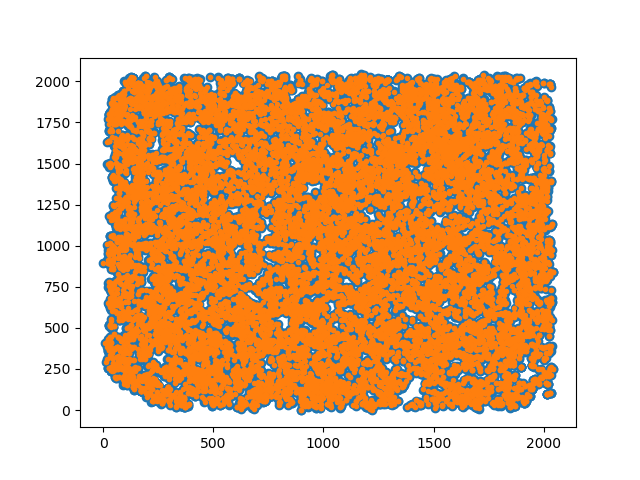

In [169]:
plt.figure()
plt.plot(zxy_647s[:,1],zxy_647s[:,2],'o')
plt.plot(zxy_750s[:,1],zxy_750s[:,2],'.')
plt.show()

In [171]:
dic_chr = pickle.load(open(analysis_folder+os.sep+'pairs_647_750.pkl','rb'))

zxy_647,zxy_750 = dic_chr['zxy_647_750']
dic_chr['m_647_750'] = ft.calc_color_matrix(zxy_647,zxy_750)
dic_bleed={}

E:\Users\Addison\TAD_analysis\ChromatinImagingV2-master\\CommonTools\FittingTools.py:850: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  m_ = [np.linalg.lstsq(A, y_[:,iy])[0] for iy in range(len(x_[0]))]


<IPython.core.display.Javascript object>


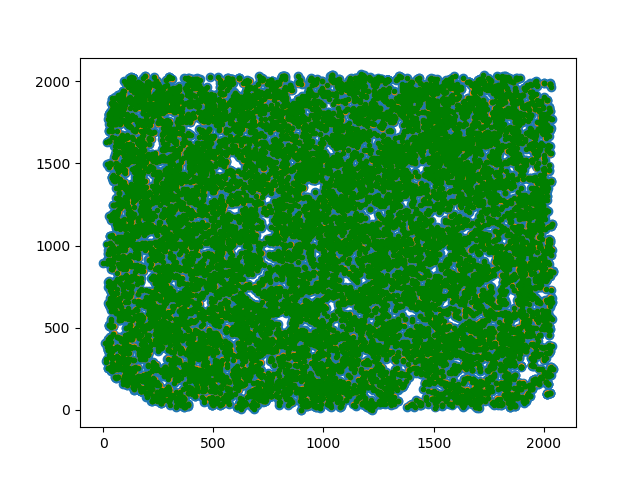

In [175]:
zxy_750T = ft.apply_colorcor(zxy_750,dic_chr['m_647_750'])
plt.figure()
plt.plot(zxy_647[:,1],zxy_647[:,2],'o')
plt.plot(zxy_750[:,1],zxy_750[:,2],'.')
plt.plot(zxy_750T[:,1],zxy_750T[:,2],'g.')
plt.show()

In [178]:
### Apply color correction and define dic_spots_cor
# dic_spots_cor is now containing the fits but also <zxys> in nm and brighnesses in <hs>
reload(ft)
dic_spots_cor = []

for dic_spot in tqdm(dic_spots):
    dic_spot_ = {kspot:(ft.correct_color(dic_spot[kspot][0],tags,
                                         zxy_pix_size = [200,109,109],
                                        dic_chr=dic_chr,dic_bleed=dic_bleed),
                        dic_spot[kspot][1]) 
     for kspot in dic_spot}
    dic_spots_cor.append(dic_spot_)

In [39]:
### Expand the neighbors
"""
hkeys = ['ps', 'zxys', 'hs']
chr_window = 30
dic_spots_corE = []
for dic_spot in tqdm(dic_spots_cor):
    #Expand
    dic_spot_E = {}
    dic_centers = {}
    for htag in tags:
        dic_spot_E[htag]={hkey:[] for hkey in hkeys}
        for kspot in dic_spot:
            dic_centers[kspot]=dic_spot[kspot][-1]
            for hkey in hkeys:
                dic_spot_E[htag][hkey].extend(dic_spot[kspot][0][htag][hkey])
    for htag in tags:
        for hkey in hkeys:
            dic_spot_E[htag][hkey]=np.array(dic_spot_E[htag][hkey])
    #Select within range
    dic_spot_={}

    for kspot in dic_spot:
        dic_spot_[kspot]=({htag:{hkey:dic_spot_E[htag][hkey][np.linalg.norm(dic_spot_E[htag]['ps'][:,1:4]-dic_centers[kspot],axis=-1)<chr_window] 
                                 for hkey in hkeys}
                      for htag in tags},dic_spot[kspot][-1])
    dic_spots_corE.append(dic_spot_)
""";

### Run the EM algorithm

In [180]:
### Initialize ########
reload(ft)
zxys_f,hs_f,cols_f  = [],[],[]

for dic_spot in tqdm(dic_spots_cor):
    for isp in dic_spot.keys():
        dic_cand = dic_spot[isp][0]
        zxys_T,hs_T,cols_T = ft.get_maxh_estimate(dic_cand,htags)
        zxys_f.append(zxys_T)
        hs_f.append(hs_T)
        cols_f.append(cols_T)

In [184]:
### Run to converge #########
reload(ft)
def refine_set(dic_spots,zxys_f,hs_f,use_local=True,use_center=True):
    print "Lengths dics,zxys:",np.sum(map(len,dic_spots)),len(zxys_f)
    Dhs,Ddists,DdistsC = ft.get_Ddists_Dhs(zxys_f,hs_f,nint=5)
    zxys_f2,hs_f2,cols_f2,scores_f2,all_scores_f2  = [],[],[],[],[]
    i_ = 0
    for dic_spot in tqdm(dic_spots):
        for isp in dic_spot.keys():
            dic_cand = dic_spot[isp][0]
            zxys_T,hs_T,cols_T,scores_T,all_scores = ft.get_statistical_estimate(dic_cand,htags,Dhs,Ddists,DdistsC,
                                     zxys_T=zxys_f[i_],nint=5,use_local=use_local,use_center=use_center)
            zxys_f2.append(zxys_T)
            hs_f2.append(hs_T)
            cols_f2.append(cols_T)
            scores_f2.append(scores_T)
            all_scores_f2.append(all_scores)
            i_+=1
    return zxys_f2,hs_f2,cols_f2,scores_f2,all_scores_f2

saved_zxys_f=[zxys_f]
save_hs_f=[hs_f]
niter = 6 # NUmber of iterations
for num_ref in range(niter):
    use_local = num_ref>niter/2-1
    print 'EM iteration number: ',num_ref+1
    
    zxys_f,hs_f,cols_f,scores_f,all_scores_f = refine_set(dic_spots_cor,zxys_f,hs_f,use_local=use_local)
    saved_zxys_f.append(zxys_f)
    save_hs_f.append(hs_f)
    
    #check convergence
    dif = np.array(saved_zxys_f[-1])-np.array(saved_zxys_f[-2])
    nan =  np.all(np.isnan(dif),axis=-1)
    same = nan|np.all(dif==0,axis=-1)
    print "fraction the same:",np.sum(same)/float(np.prod(same.shape))
    print "fraction nan:",np.sum(nan)/float(np.prod(nan.shape))
#analysis_folder = r'M:\20181124_IMR90_whole_chr21_alpha-amanitidin_Analysis_BB'
#pickle.dump((saved_zxys_f,save_hs_f),open(analysis_folder+os.sep+'save_zxyhs_10roundOpt.pkl','wb'))

EM iteration number:  1
Lengths dics,zxys: 5612 5612



fraction the same: 0.9248349809414609
fraction nan: 0.0003796213083764604
EM iteration number:  2
Lengths dics,zxys: 5612 5612



fraction the same: 0.9870037807183365
fraction nan: 0.0003796213083764604
EM iteration number:  3
Lengths dics,zxys: 5612 5612



fraction the same: 0.9948170070346153
fraction nan: 0.0003796213083764604
EM iteration number:  4
Lengths dics,zxys: 5612 5612



fraction the same: 0.9224216740524962
fraction nan: 0.0003796213083764604
EM iteration number:  5
Lengths dics,zxys: 5612 5612



fraction the same: 0.9826613777929282
fraction nan: 0.0003796213083764604
EM iteration number:  6
Lengths dics,zxys: 5612 5612



fraction the same: 0.9950261861229044
fraction nan: 0.0003796213083764604


In [182]:
zxys_f_save,hs_f_save,cols_f_save,scores_f_save,all_scores_f_save = np.array(zxys_f),np.array(hs_f),np.array(cols_f),np.array(scores_f),np.array(all_scores_f)

### Can modify htags to replace with repeat rounds that might be better.

Do not run!

In [559]:
reload(ft)
#zxys_f,hs_f = zxys_f2,hs_f2
#htags[-1]='H30R27,R65_750'#'H37R65_647'
#htags[100+40-2] = 'H84R39,R40_647'#'H20R39,R40_647'
#htags[100+40-1] = 'H84R39,R40_750'#'H20R39,R40_750'
zxys_f2,hs_f2,cols_f2,scores_f2,all_scores_f2 = refine_set(dic_spots_cor,zxys_f,hs_f,
                                                           use_local=True,use_center=True)

dif = np.array(zxys_f2)-np.array(zxys_f)
nan =  np.all(np.isnan(dif),axis=-1)
same = nan|np.all(dif==0,axis=-1)
print "fraction the same:",np.sum(same)/float(np.prod(same.shape))
print "fraction nan:",np.sum(nan)/float(np.prod(nan.shape))

zxys_f,hs_f,cols_f,scores_f,all_scores_f = zxys_f2,hs_f2,cols_f2,scores_f2,all_scores_f2

Lengths dics,zxys: 3237 3237


fraction the same: 0.9572987198900689
fraction nan: 0.002748277684086493


### Clean

### Check the distributions of the combined p-values for all the candidate spots and the selected spots

<IPython.core.display.Javascript object>


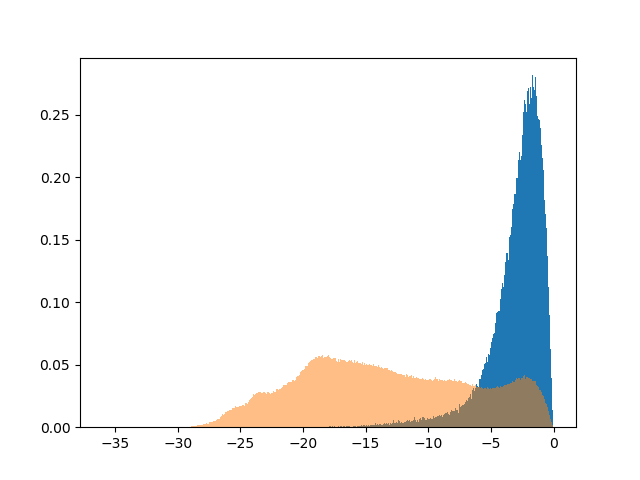

In [189]:
scores_all_rav = []
nlen = np.max(map(len,all_scores_f))
scores_all_reg = [[] for i in range(nlen)]
scores_all_bad = [[] for i in range(nlen)]
for scores_cell in all_scores_f:
    for ireg,scores_reg in enumerate(scores_cell):
        scores_all_reg[ireg].extend(scores_reg)
        scores_all_rav.extend(scores_reg)
        scores_all_bad[ireg].extend(np.sort(scores_reg)[:-1])
vec = np.ravel(np.array(scores_f))
vec = vec[np.isnan(vec)==False]
plt.figure()
plt.hist(np.log(vec),bins=1000,normed=True)
plt.hist(np.log(scores_all_rav),bins=1000,alpha=0.5,normed=True)
plt.show()

In [187]:
from scipy.spatial.distance import squareform,pdist
keep = np.array(scores_f)>np.exp(-7.) ## set the cutoff for false spots
zxys_clean = np.array(zxys_f)
zxys_clean[keep==False]=np.nan
mats_clean = np.array(map(squareform,map(pdist,zxys_clean)))

C:\Users\Addison\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater
  


254 bad


<IPython.core.display.Javascript object>


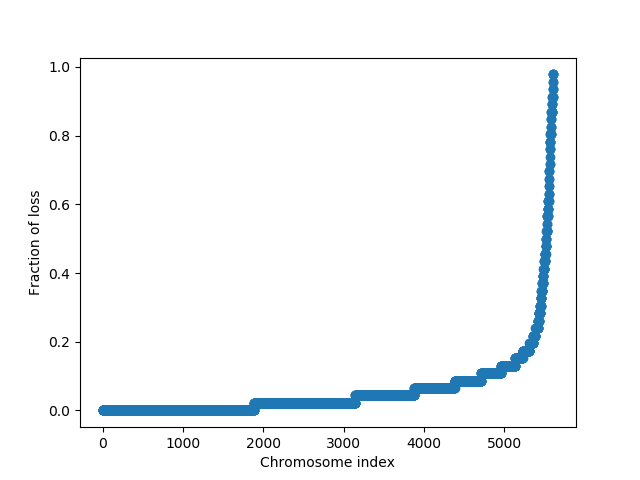

0.021739130434782608


Text(0.5,0,'Chromosome index')

In [194]:
keep = np.sum(np.isnan(zxys_clean[:,:,0]),axis=-1)<10#how many loss spots are you willing to tollorate
print len(keep)-sum(keep),"bad"
plt.figure()
frc_loss = np.sum(np.isnan(zxys_clean[:,:,0]),axis=-1)/float(zxys_clean.shape[1])
print np.median(frc_loss)
plt.plot(np.sort(frc_loss),'o-')
plt.ylabel('Fraction of loss')
plt.xlabel('Chromosome index')

In [195]:
dic_save = {"zxys_full":np.array(zxys_f),
            'hs_full':np.array(hs_f),
            'scores_full':np.array(scores_f),
            'all_scores_full':all_scores_f,
            'colors_full':np.array(cols_f),
            'keep_clean':keep,'th_scorre_clean':np.exp(-7),
            'fovs_spots':np.array(fovs_spots),'dic_drifts':dic_drifts,
            'zxys_clean':zxys_clean[keep],
            'hs_clean':np.array(hs_f)[keep],
            'htags':htags,
            'dic_chr':{}
           }
pickle.dump(dic_save,open(analysis_folder+'__zxyhs.pkl','wb'))

In [70]:
from scipy.spatial.distance import squareform,pdist
zxys_clean = dic_save['zxys_clean']
keep = np.sum(np.isnan(zxys_clean[:,:,0]),axis=-1)<10#how many loss spots are you willing to tollorate
zxys_clean[keep==False]=np.nan
mats_clean = np.array(map(squareform,map(pdist,zxys_clean)))

In [173]:
htags = dic_save['htags']
htags

['5.dax_647',
 '6.dax_647',
 '7.dax_647',
 '8.dax_647',
 '9.dax_647',
 '10.dax_647',
 '11.dax_647',
 '1.dax_750',
 '12.dax_647',
 '13.dax_647',
 '00.dax_750',
 '2.dax_750',
 '14.dax_647',
 '3.dax_750',
 '4.dax_750',
 '15.dax_647',
 '16.dax_647',
 '17.dax_647',
 '18.dax_647',
 '19.dax_647',
 '20.dax_647',
 '21.dax_647',
 '22.dax_647',
 '23.dax_647',
 '5.dax_750',
 '6.dax_750',
 '7.dax_750',
 '8.dax_750',
 '9.dax_750',
 '10.dax_750',
 '11.dax_750',
 '1.dax_647',
 '12.dax_750',
 '13.dax_750',
 '00.dax_647',
 '2.dax_647',
 '14.dax_750',
 '3.dax_647',
 '4.dax_647',
 '15.dax_750',
 '16.dax_750',
 '17.dax_750',
 '18.dax_750',
 '19.dax_750',
 '20.dax_750',
 '21.dax_750']

In [175]:
im = np.nanmedian(mats_clean[keep],0)

<IPython.core.display.Javascript object>


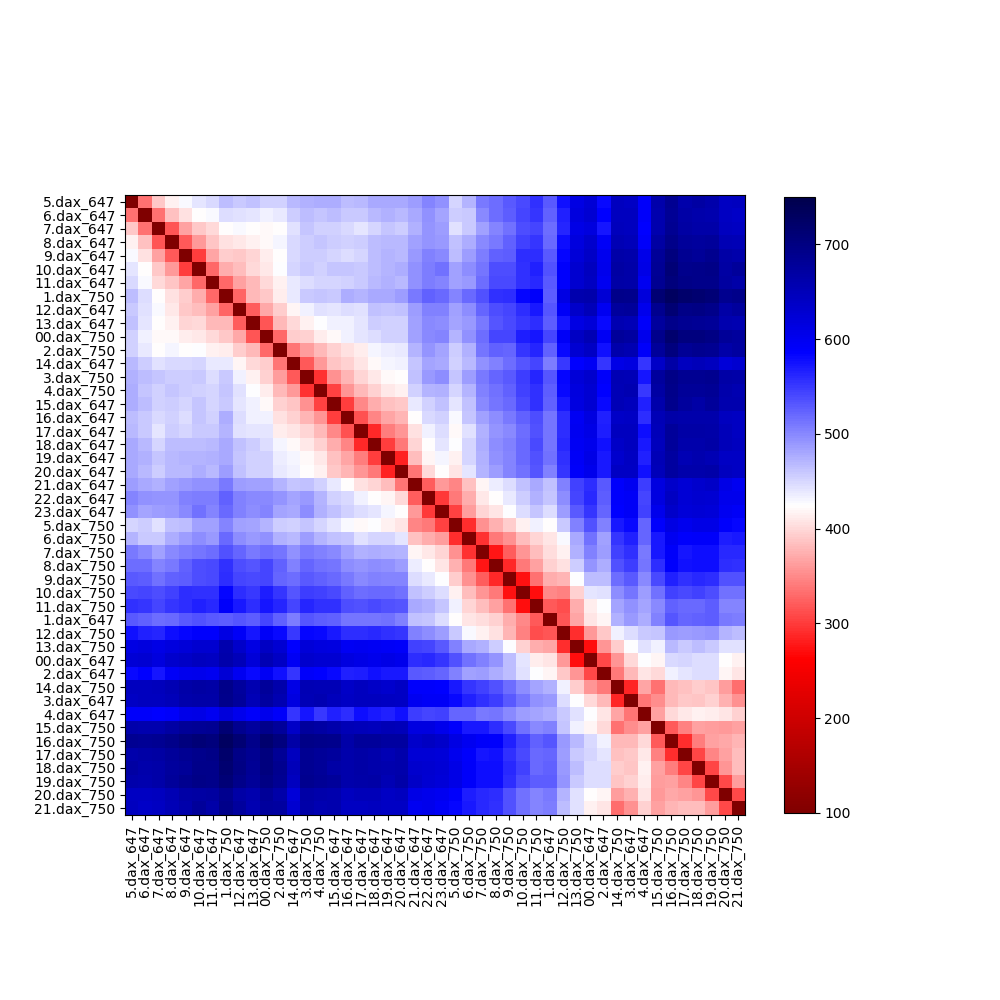

In [182]:
plt.figure(figsize=(10,10))
plt.imshow(im,cmap='seismic_r',vmin=100,vmax=750)
htags_ = htags
plt.yticks(range(len(htags_)),htags_)#,rotation='vertical')
plt.xticks(range(len(htags_)),htags_,rotation='vertical')
plt.colorbar(shrink=.8)
plt.show()

In [73]:
%matplotlib inline

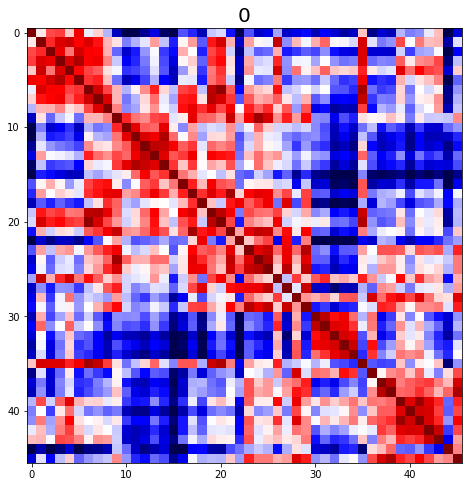

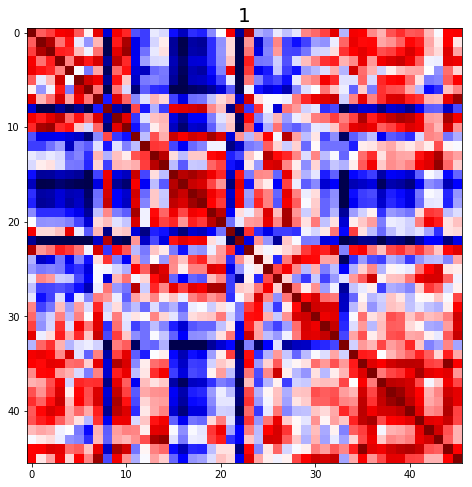

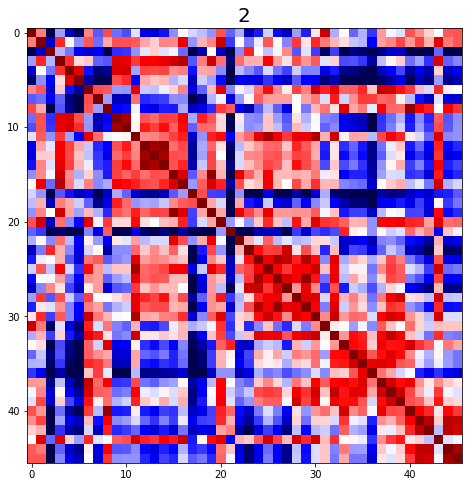

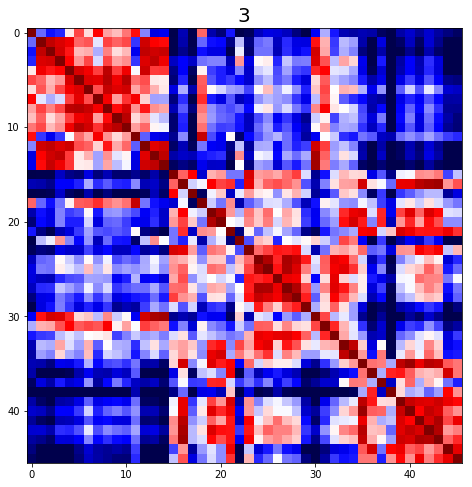

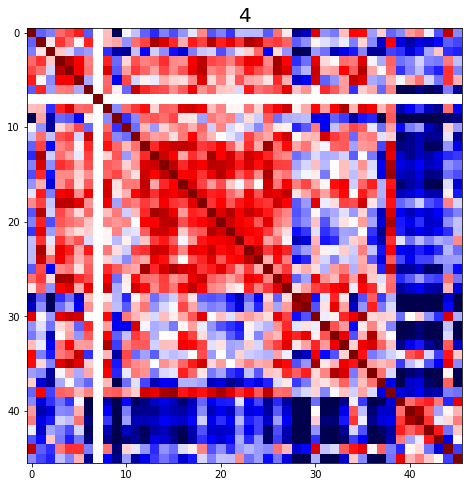

...

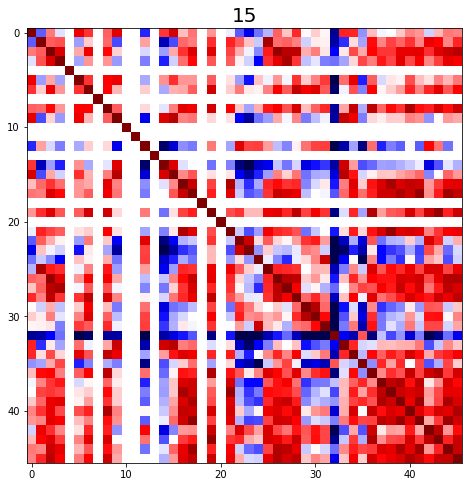

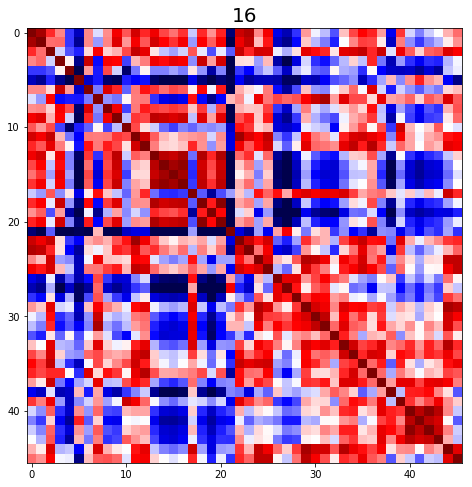

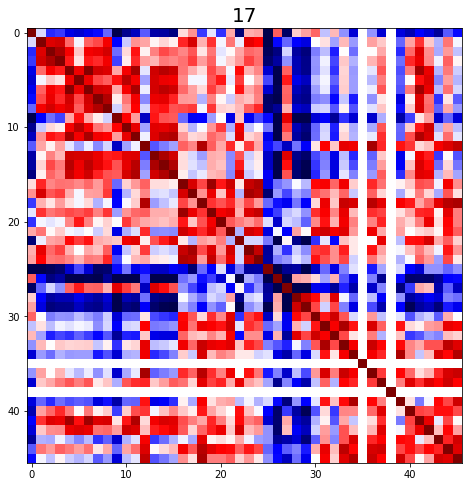

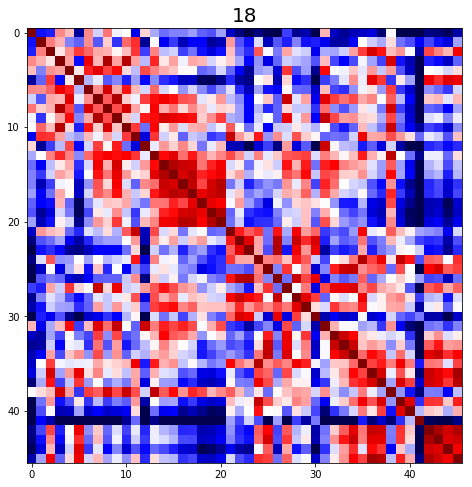

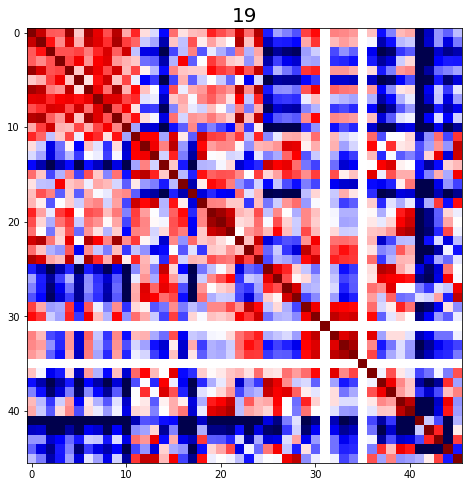

In [93]:
for i in range(20):
    plt.figure(figsize=(8,8))
    plt.imshow(mats_clean[keep][i][:,:],cmap='seismic_r',vmax=1000)
    plt.title(i,fontsize=20)
    plt.show()

In [112]:
dic_save = pickle.load(open(analysis_folder+'__zxyhs.pkl','rb'))

In [111]:
print analysis_folder

T:\20190227_g4\Analysis


In [113]:
zxys = dic_save['zxys_clean']

In [114]:
zxys[0][:,0]

array([5484.77050692, 5058.23076678, 5338.49062222, 5207.54229039,
       5043.70461626, 5292.5778138 , 5121.2263287 , 5196.39689395,
       5177.14837939, 4803.06192148, 4617.44460181, 4749.56492038,
       4923.75078546, 4951.53557157, 4799.75148343, 5001.23824948,
       5232.93965053, 4995.89044338, 5019.34850734, 5113.16997925,
       5085.90612823, 4949.37412126, 4850.24262094, 4942.57074683,
       4834.40783176, 4905.57120103, 4928.44387495, 4923.44832092,
       4716.81718077, 4909.34359262, 4695.50016428, 4785.4956174 ,
       4750.78522658, 4634.10641023, 4680.64469973, 5174.37292209,
       4570.0564942 , 4820.33941699, 4733.35115181, 4922.97505804,
       4916.71473467, 4892.78091593, 5031.87494087, 5145.45710946,
       4404.97013507, 4746.91908879])

In [10]:
from mpl_toolkits import mplot3d

In [94]:
%matplotlib notebook

In [146]:
from mpl_toolkits.mplot3d.art3d import Line3DCollection
from matplotlib.colors import ListedColormap, BoundaryNorm
points = np.array([chrom[:,0],chrom[:,1],chrom[:,2]]).T.reshape(-1,1,3)
segments = np.concatenate([points[:-1],points[1:]],axis=1)
segments[0]

array([[  5484.77050692, 102083.93493478, 106136.07199924],
       [  5058.23076678, 101875.78307603, 106064.9937243 ]])

<IPython.core.display.Javascript object>


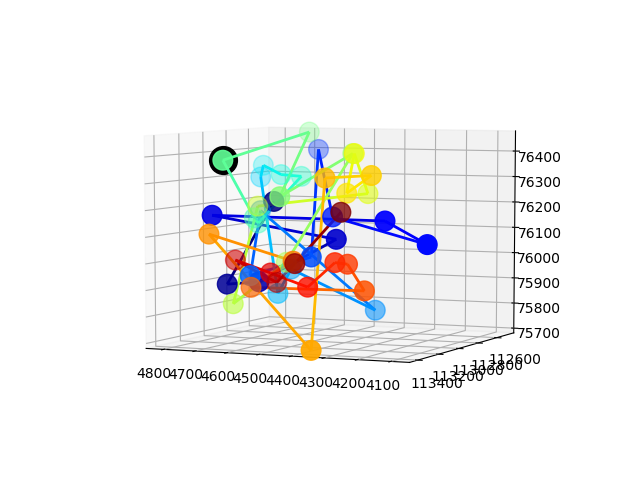

In [168]:
from mpl_toolkits.mplot3d.art3d import Line3DCollection
from matplotlib.colors import ListedColormap, BoundaryNorm

ax = plt.axes(projection='3d')
chrom = zxys[1]
col = np.arange(0,len(chrom),1)
#col[0:32] = 0
#col[32:] = 50
#col[20:23]=100

points = np.array([chrom[:,0],chrom[:,1],chrom[:,2]]).T.reshape(-1,1,3)
segments = np.concatenate([points[:-1],points[1:]],axis=1)
lc = Line3DCollection(segments,lw=2,cmap='jet')
lc.set_array(col)
ax.set_xlim(min(chrom[:,0]),max(chrom[:,0]))
ax.set_ylim(min(chrom[:,1]),max(chrom[:,1]))
ax.set_zlim(min(chrom[:,2]),max(chrom[:,2]))

ax.add_collection3d(lc)
ax.scatter3D(chrom[:,0],chrom[:,1],chrom[:,2],s=200,c=col,cmap='jet',zorder=1)
ax.scatter3D(chrom[21,0],chrom[21,1],chrom[21,2],c='k',s=400,zorder=2)
plt.show()

<IPython.core.display.Javascript object>


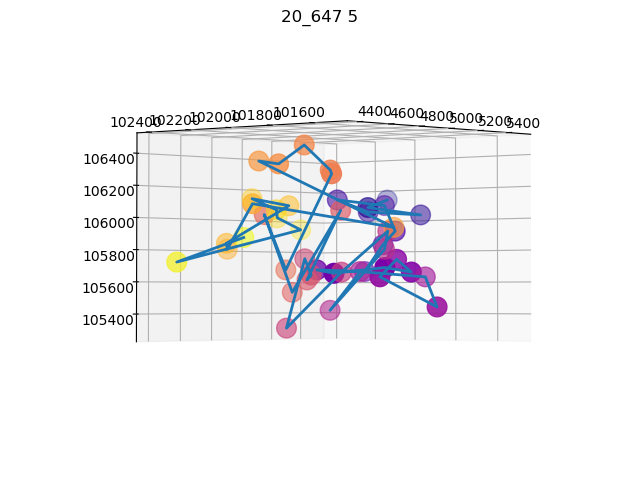

In [110]:
#look at region 24 (hyb_21_647)
im_folder = r'T:\20190227_g4\FISH\images\renamed_images'
daxs_20 = glob.glob(im_folder + os.sep + 'FISH_*_20.dax')
daxs_21 = glob.glob(im_folder + os.sep + 'FISH_*_21.dax')
daxs_22 = glob.glob(im_folder + os.sep + 'FISH_*_22.dax')
ims,lbl = [],[]
for ind, dax in enumerate(daxs_20[:10]):
    im = io.DaxReader(dax).loadMap()
    ims += [im[112:168]]
    lbl_ = ['20_647 ' + str(ind)]
    lbl += lbl_
    im = io.DaxReader(daxs_21[ind]).loadMap()
    ims += [im[112:168]]
    lbl_ = ['21_647 ' + str(ind)]
    lbl += lbl_
    im = io.DaxReader(daxs_22[ind]).loadMap()
    ims += [im[112:168]]
    lbl_ = ['22_647 ' + str(ind)]
    lbl += lbl
mv_ = mv.imshow_mark_3d(ims,image_names=lbl)

In [109]:
lbl

[]